In [1]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Dense, ReLU, Input, Conv2D, Flatten, Lambda
from tensorflow.keras.models import Model, Sequential
import tensorflow.keras.backend as K

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In c:\programdata\miniconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In c:\programdata\miniconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In c:\programdata\miniconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In c:\programdata\miniconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In c:\programdata\miniconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_tes

In [2]:
TEST = True

In [265]:
def overall_cost(ratio, content_loss, style_loss, total_var_loss) : 
    loss = ratio[0] * content_loss + ratio[1] * style_loss + ratio[2] * total_var_loss
    
    return loss

def cost_content(outputs_anchor, outputs_gen) : 
    """
    output_anchor: output of the model when the latter is fed with the anchor image
    outputs_gen: output of the model when fed with the generated image
    """
    loss = tf.constant(.0)
    # even if we have mutliple layers, optimizing the content loss for one layer is the same
    # as optimizing for multiple layers
    out_gen, out_anch = outputs_gen[0], outputs_anchor[0]

    loss += K.sum((out_gen - out_anch) ** 2)
    return loss


def get_gram_matrix(img) :
    if len(K.int_shape(img)) == 3 : width, height, channels = K.int_shape(img)
    else : _, width, height, channels = K.int_shape(img)
    
    # goes from a 3D object to a 2D
    layer_2D = tf.reshape(img, (width * height, channels))
    
    # trick: every layer is transformed in a line vector (simpler for multiplications)
    trans_layer = K.transpose(layer_2D)
    
    gram = tf.matmul(trans_layer, layer_2D)
    
    return gram

def cost_style(gram_style, outputs_gen) : 
    """
    gram_style: gram matrix of the style image. Since it never changes, we pre-compute it and save it
    outputs_gen: output of the model when fed with the generated image
    """
    loss = tf.constant(.0)
    for out_gen, gram in zip(outputs_gen, gram_style) : 
        # get correlations
        gram_gen = get_gram_matrix(out_gen)
        
        # get the number of neurons per layer to normalize the loss
        N = np.prod(K.int_shape(out_gen))
        
        # get loss
        diff = (1 / 4 / N * (gram - gram_gen)) ** 2
        loss += K.sum(diff)

    return loss

def total_variation_loss(x) :
    if len(K.int_shape(x)) == 3 : 
        nb_rows, nb_cols, nb_channels = K.int_shape(x)
        a = (x[: nb_rows - 1, : nb_cols - 1, :] - x[1:, : nb_cols - 1, :]) ** 2
        b = (x[: nb_rows - 1, : nb_cols - 1, :] - x[: nb_rows - 1, 1:, :]) ** 2
    else : 
        _, nb_rows, nb_cols, nb_channels = K.int_shape(x)
        a = (x[:, : nb_rows - 1, : nb_cols - 1, :] - x[:, 1:, : nb_cols - 1, :]) ** 2
        b = (x[:, : nb_rows - 1, : nb_cols - 1, :] - x[:, : nb_rows - 1, 1:, :]) ** 2   
    
    loss = K.mean(tf.pow(a + b, 1.25))
    
    return loss

def compute_grad(ratio, gen_img, output_anchor, gram_style, model) :        
    with tf.GradientTape() as tape : 
        tape.watch(gen_img)
            
        # get the activations / output of the layers for the generated image
        outputs_gen = model(gen_img)
        
        # compute the two different losses
        content_loss = cost_content(output_anchor, outputs_gen) 
        style_loss = cost_style(gram_style, outputs_gen)
        total_var_loss = total_variation_loss(gen_img)
        
        # get global loss
        loss = overall_cost(ratio, content_loss, style_loss, total_var_loss)
    
    grad = tape.gradient(loss, gen_img)
    
    # normalize the gradient
    grad /= K.std(grad) + 1e-5
    
    return grad, loss, content_loss, style_loss, total_var_loss

def plot_img(image : np.ndarray, title : str = "",) :
    # make sure we have an image of the right size
    if len(image.shape) == 3 : img = image
    else : img = image[0, :, :, :]

    plt.figure(figsize = (15, 10))
    plt.title(title)
    plt.imshow(img)
    plt.show()
    
def load_images(style_path, anchor_path) : 
    if "png" not in style_path : style_img = mpimg.imread(style_path) / 255
    else : style_img = mpimg.imread(style_path)[:,:,:3]

    if "png" not in anchor_path : anchor_img = mpimg.imread(anchor_path) / 255
    else : anchor_img = mpimg.imread(anchor_path)[:,:,:3]

    # convert both images to a tensor
    tf_style, tf_anchor = tf.convert_to_tensor(style_img), tf.convert_to_tensor(anchor_img)


    return tf_style, tf_anchor

def plot_loss(content_loss, style_loss, var_loss, overall_loss) :
    maxi = np.max(overall_loss)
    plt.figure(figsize = (15, 10))
    plt.title("Plot of the losses")
    plt.plot(content_loss, label = "content loss")
    plt.plot(style_loss, label = "style loss")
    plt.plot(var_loss, label = "total variation loss")
    plt.plot(overall_loss, label = "overall loss")
    plt.ylabel("loss")
    plt.ylim([0, 1.1 * maxi])
    plt.xlabel("iteration")
    plt.legend()
    plt.show()


In [278]:
def neural_style_transfer(anchor_img, style_img, model, nb_iterations = 50, ratio = .5, 
                          lr = .1, plot_every = 10) : 
    # loss lists (for debugging purposes)
    l_loss, l_loss_content, l_loss_style, l_var_loss = [], [], [], []
    shape = K.int_shape(anchor_img)
    
    # initialize the generated image
    gen_img = tf.random.uniform(shape, minval = .45, maxval = .55) 
    
    # compute model output for the anchor image (used multiple times, but never changes)
    out_anchor = model(anchor_img)
    
    # compute gram matrix for style image (used several times, never changes)
    _style = model(style_img)
    gram_style = [get_gram_matrix(out) for out in _style]

    # used to smooth the gradient (ADAM)
    smoothed_grad = tf.zeros(tf.shape(gen_img))
    new_ratio = ratio[ : ]
    for k in range(1, nb_iterations + 1) : 
        grad, loss, cont_loss, style_loss, var_loss = compute_grad(new_ratio, gen_img, out_anchor, gram_style, model)        
        smoothed_grad = .9 * smoothed_grad + .1 * grad 
        
        gen_img -= lr * smoothed_grad
        
        l_loss.append(loss), l_loss_content.append(new_ratio[0] * cont_loss)
        l_loss_style.append(new_ratio[1] * style_loss), l_var_loss.append(new_ratio[2] * var_loss)
        
        # make sure we remain between 0 and 1
        gen_img = tf.clip_by_value(gen_img, 0, 1)
        
        # udpating the ratios to make sure they remain constant 
        new_ratio[1] = ratio[1] * cont_loss / style_loss
        new_ratio[2] = ratio[2] * cont_loss / var_loss

        if k % plot_every == 0 : 
            plot_img(gen_img.numpy())
            # removing the first term as the loss terms are not updated using new_ratio
            plot_loss(l_loss_content[1:], l_loss_style[1:], l_var_loss[1:], l_loss[1:],)
        else : pass
        
        
    return gen_img, l_loss, l_loss_content, l_loss_style

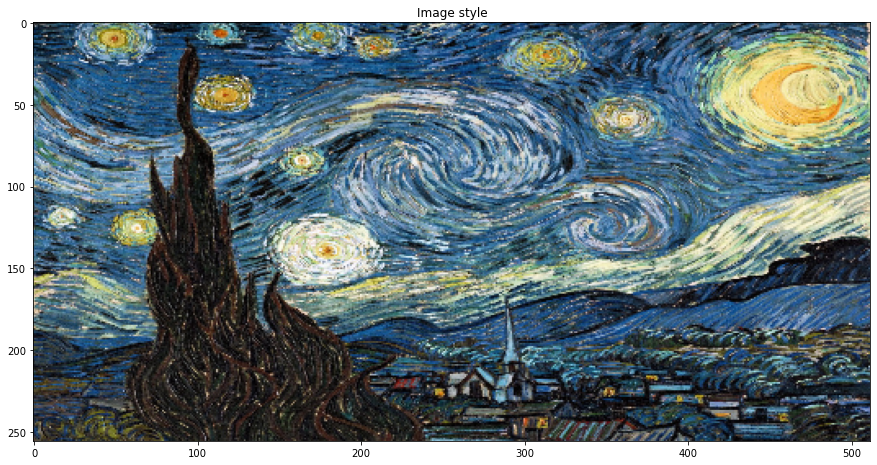

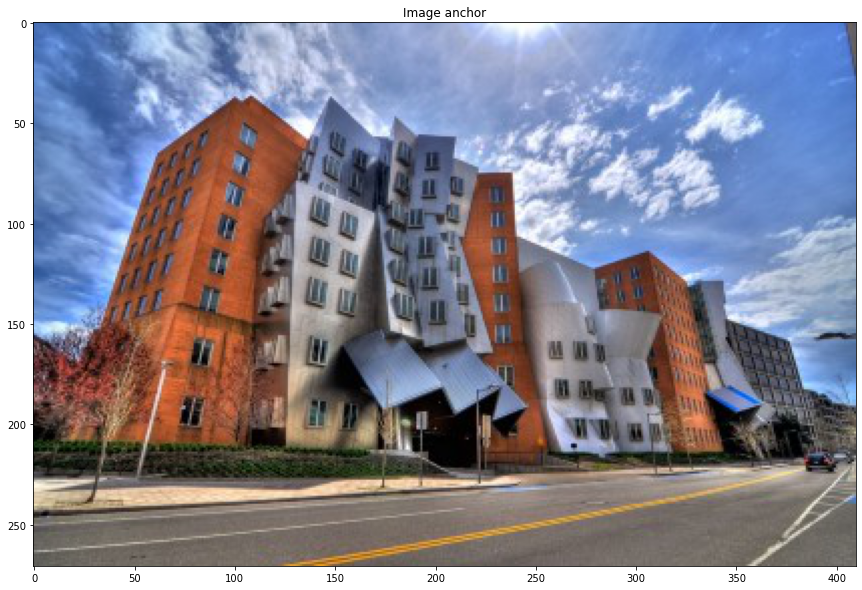

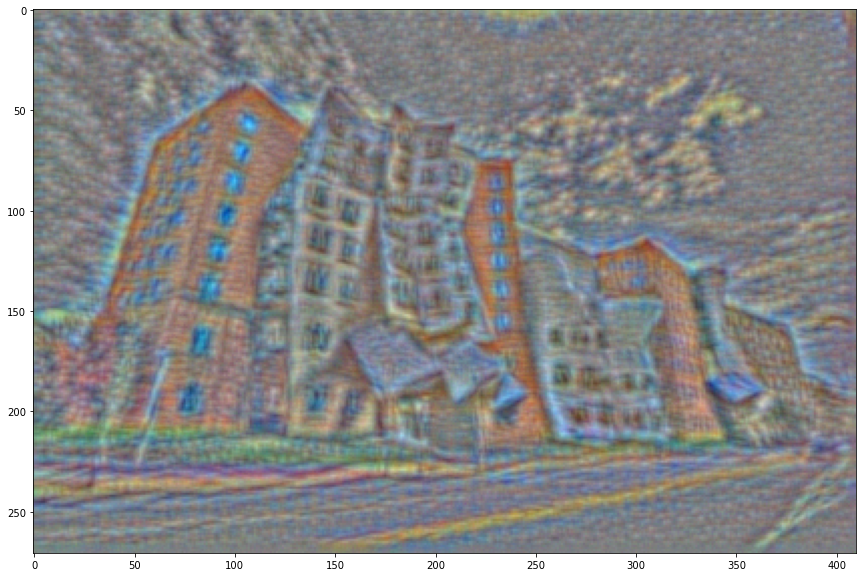

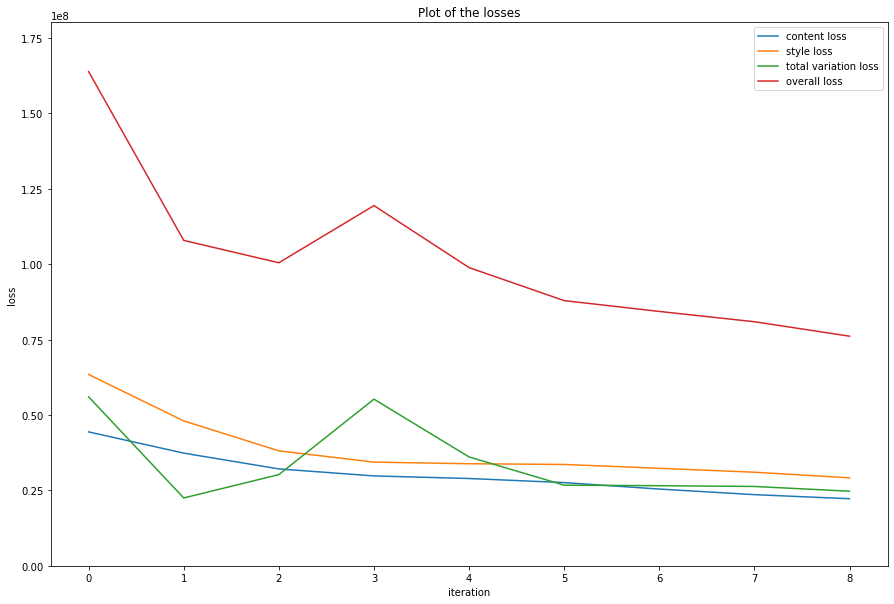

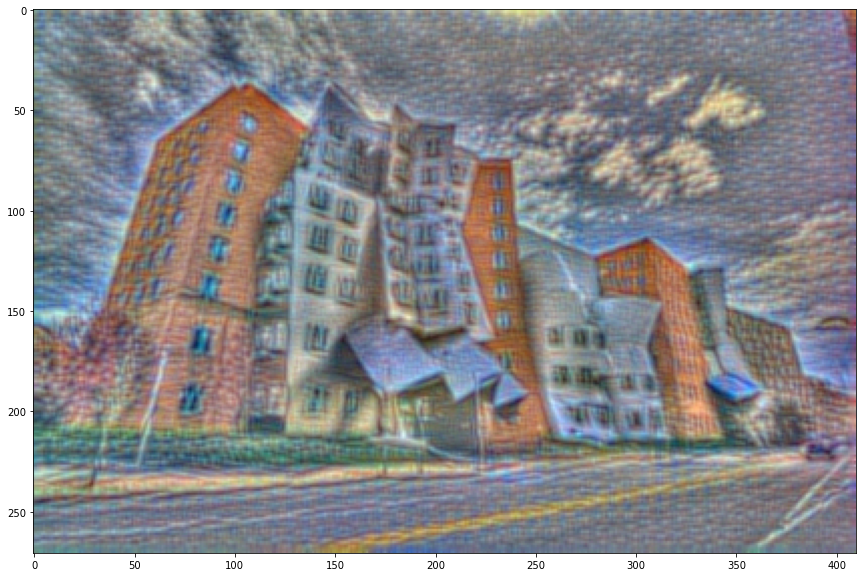

...

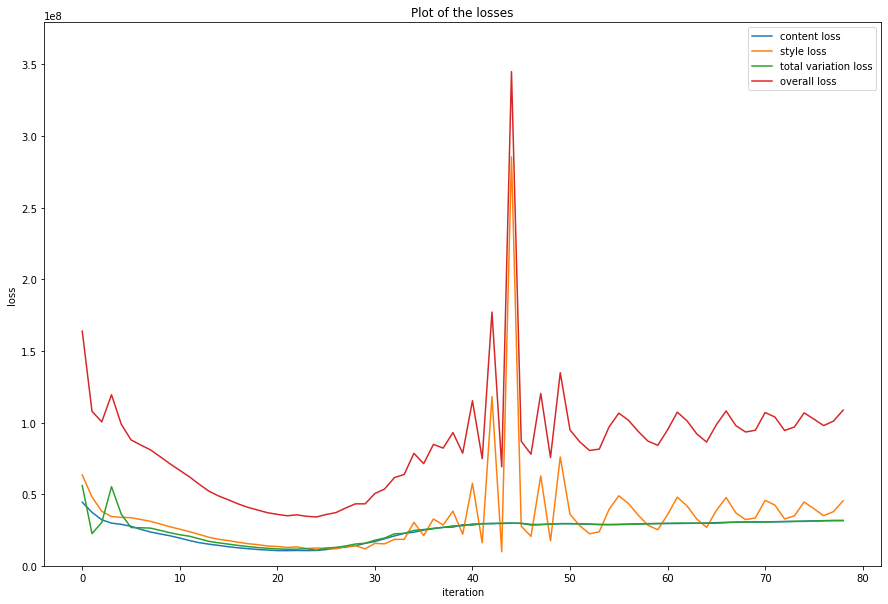

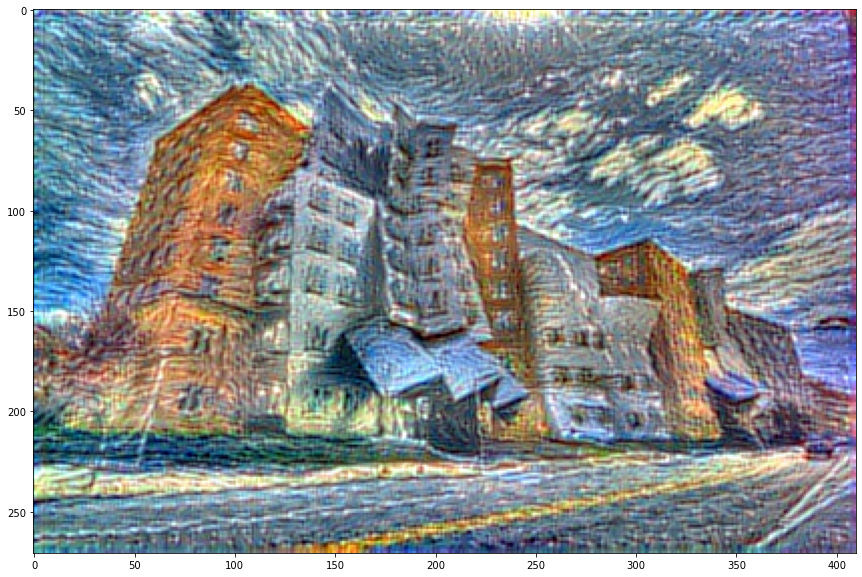

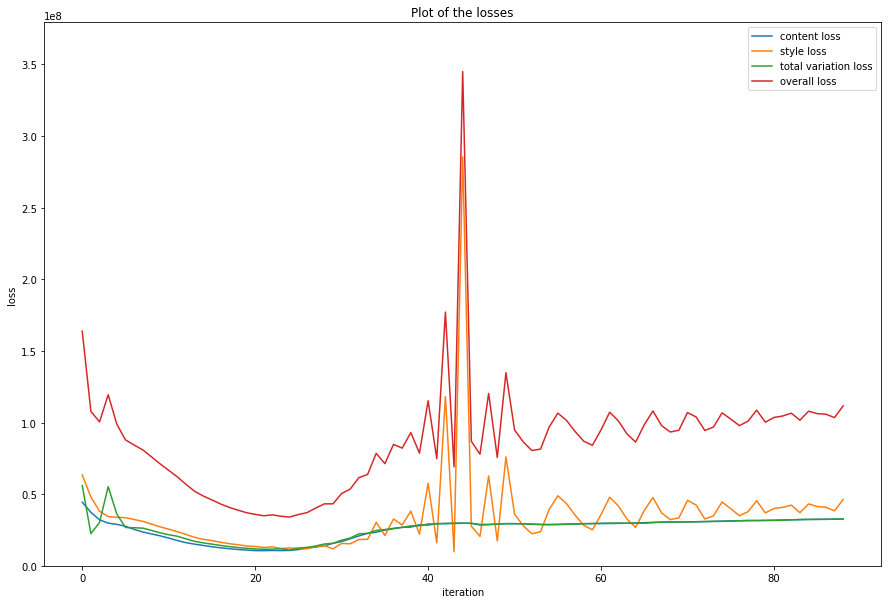

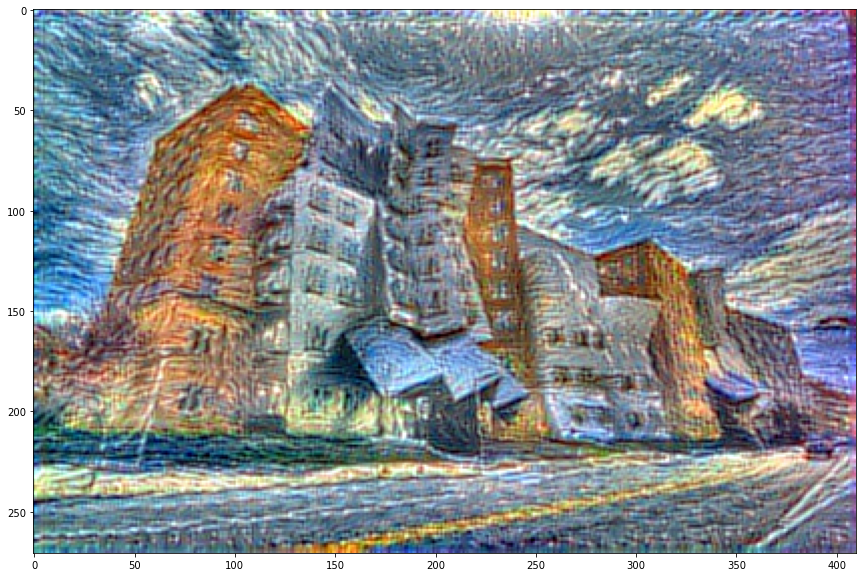

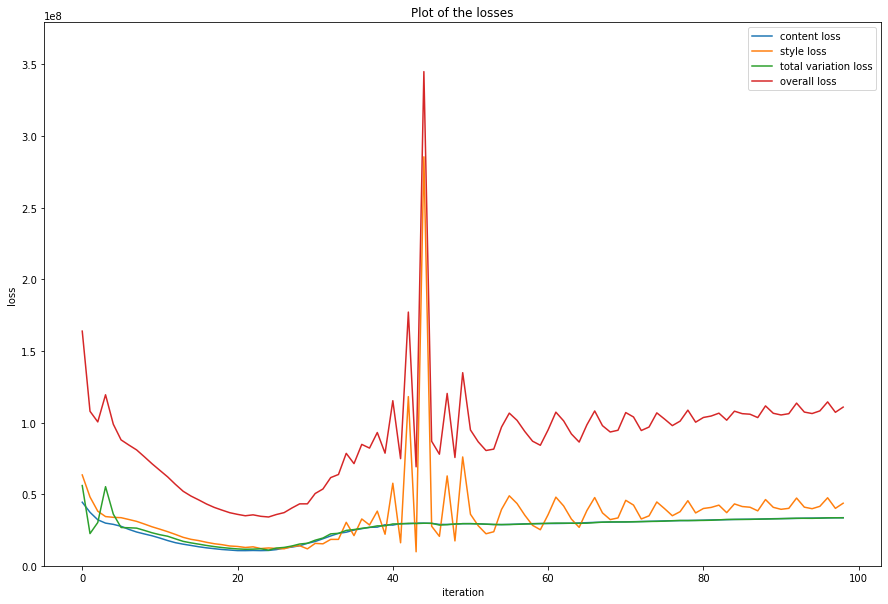

(<tf.Tensor: shape=(1, 271, 410, 3), dtype=float32, numpy=
 array([[[[0.4040682 , 0.6874846 , 0.7135093 ],
          [0.5593926 , 0.85541797, 0.9139695 ],
          [0.5325482 , 0.76894194, 0.94921696],
          ...,
          [0.67110914, 0.21134745, 0.26984978],
          [0.709443  , 0.1854355 , 0.24008797],
          [0.70398945, 0.10320801, 0.16360664]],
 
         [[0.5163754 , 0.77341074, 0.8405315 ],
          [0.7515333 , 0.9829746 , 1.        ],
          [0.59945   , 0.74719775, 1.        ],
          ...,
          [0.60424846, 0.13435978, 0.23567572],
          [0.6842021 , 0.18999994, 0.28389177],
          [0.6567315 , 0.1624909 , 0.23559515]],
 
         [[0.36182034, 0.5281452 , 0.65224135],
          [0.49700353, 0.64566225, 0.8761519 ],
          [0.33184144, 0.42755422, 0.8022333 ],
          ...,
          [0.5858741 , 0.18270992, 0.28694767],
          [0.64213127, 0.20226732, 0.30455855],
          [0.55032986, 0.09608794, 0.20139313]],
 
         ...,
 
       

In [293]:
style_path = "../pics/starry_night.jpg"
anchor_path = "../pics/city.jpeg"


tf_style, tf_anchor = load_images(style_path, anchor_path)
# resize images to speed up the process
style_shape, anchor_shape = tf.shape(tf_style).numpy()[:2], tf.shape(tf_anchor).numpy()[:2]
style_shape, anchor_shape = np.array([256, 512], dtype = int), np.array(anchor_shape, dtype = int)

tf_style, tf_anchor = tf.image.resize(tf_style, style_shape), tf.image.resize(tf_anchor, anchor_shape)

plot_img(tf_style, title = "Image style")
plot_img(tf_anchor, title = "Image anchor")

# add another dimension in order to be able to call the model on the images
tf_style, tf_anchor = tf_style[None,:,:,:], tf_anchor[None,:,:,:]

# get the model
vgg = tf.keras.applications.VGG16(include_top=False, weights='imagenet')
input = vgg.input

# taking convolution layers as outputs
outputs = [layer.output for k, layer in enumerate(vgg.layers) if k in [7]]
model = Model(input, outputs)


neural_style_transfer(tf_anchor, tf_style, model, plot_every = 10, 
                      nb_iterations = 100, lr = .1, ratio = [1, 1.3, 1])

In [286]:
inception = tf.keras.applications.VGG16(include_top=False, weights='imagenet')

for _, k in enumerate(inception.layers) : print(_, k.name)

0 input_150
1 block1_conv1
2 block1_conv2
3 block1_pool
4 block2_conv1
5 block2_conv2
6 block2_pool
7 block3_conv1
8 block3_conv2
9 block3_conv3
10 block3_pool
11 block4_conv1
12 block4_conv2
13 block4_conv3
14 block4_pool
15 block5_conv1
16 block5_conv2
17 block5_conv3
18 block5_pool


In [240]:
import inspect
print(inspect.getsource(neural_style_transfer))

def neural_style_transfer(anchor_img, style_img, model, nb_iterations = 50, ratio = .5, 
                          lr = .1, plot_every = 10) : 
    # loss lists (for debugging purposes)
    l_loss, l_loss_content, l_loss_style = [], [], []
    shape = K.int_shape(anchor_img)
    
    # initialize the generated image
    gen_img = tf.random.uniform(shape, minval = .45, maxval = .55) 
    
    # compute model output for the anchor image (used multiple times, but never changes)
    out_anchor = model(anchor_img)
    
    # compute gram matrix for style image (used several times, never changes)
    _style = model(style_img)
    gram_style = [get_gram_matrix(out) for out in _style]

    new_ratio = ratio
    # used to smooth the gradient (ADAM)
    smoothed_grad = tf.zeros(tf.shape(gen_img))
    for k in range(1, nb_iterations + 1) : 
        grad, loss, cont_loss, style_loss = compute_grad(new_ratio, gen_img, out_anchor, gram_style, model)        
        smoothed_grad = .9 * smoothed_grad

In [294]:
import os
os.cpu_count()

64

In [262]:
tf.shape(model(tf_anchor)[0])

<tf.Tensor: shape=(4,), dtype=int32, numpy=array([  1,   7,  11, 512])>